In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import sqlite3
import pandas as pd
import numpy as np
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
import gensim
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix,auc,accuracy_score
from nltk.stem.porter import PorterStemmer
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle
con = sqlite3.connect("database.sqlite") 
filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 """, con) 
def partition(x):
    if x < 3:
        return 'negative'
    return 'positive'

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative

C:\Users\LENOVO\Anaconda3\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [2]:
import pickle
def savetofile(obj,filename):
    pickle.dump(obj,open(filename+".p","wb"))
def openfromfile(filename):
    temp = pickle.load(open(filename+".p","rb"))
    return temp

In [3]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score


In [4]:
filtered_data.head()


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,positive,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,negative,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,positive,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,negative,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,positive,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [5]:
import nltk
nltk.download('stopwords')
sno=nltk.stem.SnowballStemmer('english')
stop = set(stopwords.words('english'))
def cleanhtml(sentence):
  cleanr=re.compile('<.*?>')
  cleantext=re.sub(cleanr,' ',sentence)
  return cleantext
def cleanpunc(sentence):
  cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
  cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned) 
  return cleaned
print(stop)
print('************************************')
print(sno.stem('tasty'))   

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
{'he', 'doesn', "that'll", 'than', 'who', 'but', 'any', 'other', 'been', 'does', 'these', 'there', 'own', 'here', 'against', 'with', 'we', 'their', 'by', 'into', 'themselves', "wouldn't", 'y', 'your', "isn't", 'such', 'so', 'am', 'between', 'mightn', 'too', 'if', 'after', 'it', 'yourself', 'an', 'on', 'was', 'him', "should've", 'as', 's', 'them', "you're", 'have', 'then', 'during', 'why', 'has', 'our', 'when', 't', 'nor', "mustn't", 'ma', 'ours', 'of', 'whom', 'hers', 'each', 'out', 'up', 'for', 'where', "aren't", 'were', "wasn't", 'm', 're', 'they', 'be', "weren't", 'how', "she's", 'should', 'yourselves', 'off', "shan't", 'or', 'my', 'you', 'and', 'again', 'below', 'do', 'most', 'i', 'both', 'very', 'myself', 'itself', 'needn', 'to', 'now', 'only', 'she', 'down', 'mustn', 'aren', 'once', 'what', 'will', "don't", 'haven', 'all'

In [6]:
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')
final = sorted_data.drop_duplicates(subset= { 'UserId', 'ProfileName', 'Time',  'Text'})

In [7]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

# Time based splitting

In [8]:
import datetime
from tqdm import tqdm

In [9]:
final['Time'] = final['Time'].map(lambda t:datetime.datetime.fromtimestamp(int(t)).strftime('%Y-%m-%d %H:%M:%S'))

In [10]:
final["Time"].head()

138706    1999-10-08 05:30:00
138688    2007-11-11 05:30:00
138689    2007-10-04 05:30:00
138690    2004-02-06 05:30:00
138691    2002-04-10 05:30:00
Name: Time, dtype: object

In [11]:
final=final.sort_values('Time',axis=0,kind="quicksort", ascending=True).reset_index(drop=True)

In [17]:
i=0
str1=' '
final_string=[]
all_positive_words=[] # store words from +ve reviews here
all_negative_words=[] # store words from -ve reviews here.
s=''
for sent in tqdm(final['Text'].values):
    filtered_sentence=[]
    #print(sent);
    sent=cleanhtml(sent) # remove HTMl tags
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if((cleaned_words.isalpha()) & (len(cleaned_words)>2)):    
                if(cleaned_words.lower() not in stop):
                    s=(sno.stem(cleaned_words.lower())).encode('utf8')
                    filtered_sentence.append(s)
                    if (final['Score'].values)[i] == 'positive': 
                        all_positive_words.append(s) #list of all words used to describe positive reviews
                    if(final['Score'].values)[i] == 'negative':
                        all_negative_words.append(s) #list of all words used to describe negative reviews reviews
                else:
                    continue
            else:
                continue 
    #print(filtered_sentence)
    str1 = b" ".join(filtered_sentence) #final string of cleaned words
    #print("***********************************************************************")
    
    final_string.append(str1)
    i+=1
      
  


100%|█████████████████████████████████████████████████████████████████████████| 364171/364171 [07:37<00:00, 795.42it/s]


In [12]:
final_string=openfromfile('final_string')

In [13]:
len(final_string)

364171

In [14]:
final['CleanedText']=final_string #adding a column of CleanedText which displays the data after pre-processing of the review 
final['CleanedText']=final['CleanedText'].str.decode("utf-8")

In [106]:
final_sample=final['CleanedText'].values[0:100000]
final_score=final['Score'].values[0:100000]

In [131]:
!pip install xgboost

distributed 1.21.8 requires msgpack, which is not installed.
You are using pip version 10.0.1, however version 18.1 is available.
You should consider upgrading via the 'python -m pip install --upgrade pip' command.


# FUNCTION FOR RANDOM FOREST CLASSIFIER

In [51]:

def RANDOMFORESTCLASSIFIER(X_train,Y_train,X_test,Y_test,optimum_baselearner):
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import precision_score
    from sklearn.metrics import f1_score
    from sklearn.metrics import recall_score
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
    from sklearn.ensemble import RandomForestClassifier
    clf = RandomForestClassifier(n_estimators=optimum_baselearner,max_features='auto',max_depth=18,class_weight='balanced')
    clf.fit(X_train,Y_train)
    pred = clf.predict(X_test)
    print(' accuracy with baselearner =',optimum_baselearner,' is ' ,np.round((accuracy_score(Y_test, pred)*100),decimals = 2))
    print('F1 score with baselearner=',optimum_baselearner,' is ' , np.round((f1_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print('Recall with baselearner =',optimum_baselearner,' is ' , np.round((recall_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print('Precision with baselearner=',optimum_baselearner,' is ' , np.round((precision_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print ('\n Classification report  with baselearner =',optimum_baselearner,' is \n ' , classification_report(Y_test,pred)) 
   
    df_cm = pd.DataFrame(confusion_matrix(Y_test, pred), range(2),range(2))
    sns.set(font_scale=1.4)
    sns.heatmap(df_cm, annot=True,annot_kws={"size": 18}, fmt='g')
    print("**************************")
    print("train_score is",clf.score(X_train,Y_train))
    print("***************************")
    print("test_score is",clf.score(X_test,Y_test))

# GBDT CLASSIFIER

In [112]:
def gdbtclassifier(X_train,Y_train,X_test,Y_test,optimum_baselearner,optimum_depth,optimum_rate):
    from xgboost import XGBClassifier
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
    
    clf =XGBClassifier(max_depth=optimum_depth,n_estimators=optimum_baselearner,learning_rate=optimum_rate)
    clf.fit(X_train,Y_train)
    pred=clf.predict(X_test)
    print(' accuracy with depth =',optimum_depth,' is ' ,np.round((accuracy_score(Y_test, pred)*100),decimals = 2))
    print('F1 score with depth=',optimum_depth,' is ' , np.round((f1_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print('Recall with depth=',optimum_depth,' is ' , np.round((recall_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print('Precision with depth=',optimum_depth,' is ' , np.round((precision_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print ('\n Classification report  with depth=',optimum_depth,' is \n ' , classification_report(Y_test,pred)) 
   
    df_cm = pd.DataFrame(confusion_matrix(Y_test, pred), range(2),range(2))
    sns.set(font_scale=1.4)
    sns.heatmap(df_cm, annot=True,annot_kws={"size": 18}, fmt='g')
    print("**************************")
    print("train_score is",clf.score(X_train,Y_train))
    print("***************************")
    print("test_score is",clf.score(X_test,Y_test))
    

# CROSS VALIDATION FOR  OPTIMAL K

In [98]:
def optimal_hyperparamter(X_train,y_train):
   
    
    estimator_values=list(range(50,500,50))
    
    from sklearn.model_selection import GridSearchCV
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.cross_validation import cross_val_score
    param_grids={'n_estimators':estimator_values}
    clf = RandomForestClassifier()
    gsv= GridSearchCV(clf, param_grids,n_jobs=-1)
    gsv.fit(X_train,y_train)
     

    return gsv.best_params_

# CROSS VALIDATION FOR GBDT

In [197]:
def optimal_hyperparamter_gbdt(X_train,y_train):
    from xgboost import XGBClassifier
    
    estimator_values=list(range(50,500,50))
    depth_values = list(range(2,5,1))
    learning_values=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
    from sklearn.model_selection import GridSearchCV
    
    param_grids={'n_estimators':estimator_values,'max_depth':depth_values,'learning_rate':learning_values}
    clf = XGBClassifier()
    gsv= GridSearchCV(clf, param_grids,n_jobs=-1)
    gsv.fit(X_train,y_train)
     

    return gsv.best_params_

# Bag of words -(LINEAR CLASSIFIER)

In [107]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(final_sample,final_score,test_size=0.3,shuffle=False)

In [108]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer(ngram_range=(1,1))
Vocabulary = count_vect.fit_transform(X_train)


In [109]:
bow_X_train=count_vect.transform(X_train)
bow_X_test=count_vect.transform(X_test)

In [102]:
optimal_hyperparamter(bow_X_train,Y_train)

{'n_estimators': 50}

# Random forest CLASSIFIER for BOW

 accuracy with baselearner = 50  is  86.74
F1 score with baselearner= 50  is  76.11
Recall with baselearner = 50  is  81.04
Precision with baselearner= 50  is  73.26

 Classification report  with baselearner = 50  is 
               precision    recall  f1-score   support

   negative       0.51      0.73      0.60      4103
   positive       0.95      0.89      0.92     25897

avg / total       0.89      0.87      0.88     30000

**************************
train_score is 0.9012285714285714
***************************
test_score is 0.8674333333333333


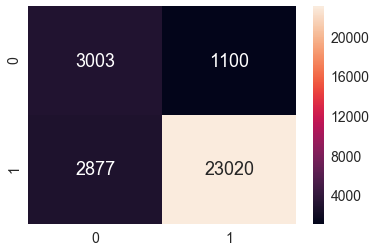

In [53]:
 RANDOMFORESTCLASSIFIER(bow_X_train,Y_train,bow_X_test,Y_test,50)

In [110]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=50,max_features='auto',max_depth=20)
clf.fit(bow_X_train,Y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=20, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [55]:
estimator = clf.estimators_[5]

from sklearn.tree import export_graphviz

from sklearn import tree
tree.export_graphviz(estimator,out_file='tree.dot')  

In [60]:
from subprocess import call

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

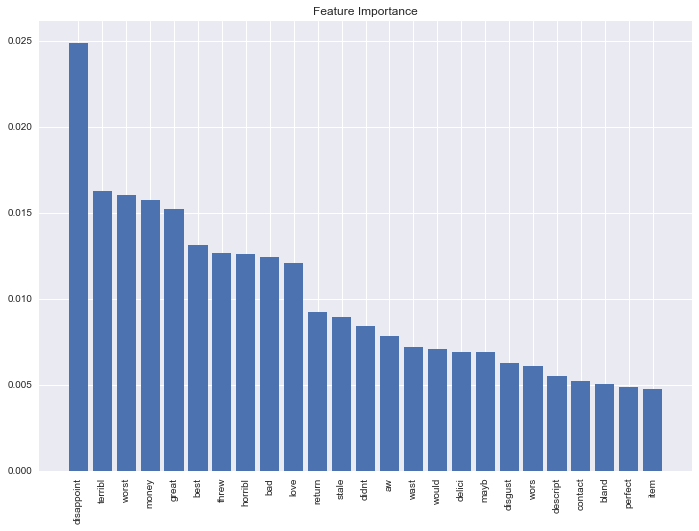

In [111]:
importances = clf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1][:25]

# Rearrange feature names so they match the sorted feature importances
names = count_vect.get_feature_names()

sns.set(rc={'figure.figsize':(11.7,8.27)})

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(25), importances[indices])

# Add feature names as x-axis labels
names = np.array(names)
plt.xticks(range(25), names[indices], rotation=90)

# Show plot
plt.show()

# GBDT ON BOW

In [198]:
optimal_hyperparamter_gbdt(bow_X_train,Y_train)

{'learning_rate': 0.5, 'max_depth': 4, 'n_estimators': 450}

 accuracy with depth = 4  is  91.8
F1 score with depth= 4  is  80.01
Recall with depth= 4  is  76.27
Precision with depth= 4  is  85.93

 Classification report  with depth= 4  is 
               precision    recall  f1-score   support

   negative       0.79      0.55      0.65      4103
   positive       0.93      0.98      0.95     25897

avg / total       0.91      0.92      0.91     30000

**************************
train_score is 0.9651
***************************
test_score is 0.9179666666666667


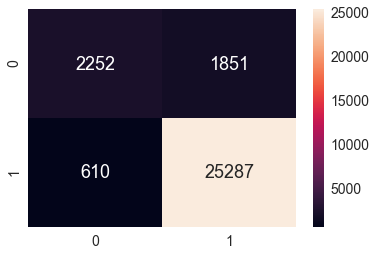

In [204]:
gdbtclassifier(bow_X_train,Y_train,bow_X_test,Y_test,450,4,0.5)

In [113]:
from xgboost import XGBClassifier

clf = XGBClassifier(n_estimators=450,max_features='auto',max_depth=4,learning_rate=0.5)
clf.fit(bow_X_train,Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.5, max_delta_step=0,
       max_depth=4, max_features='auto', min_child_weight=1, missing=None,
       n_estimators=450, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
       subsample=1)

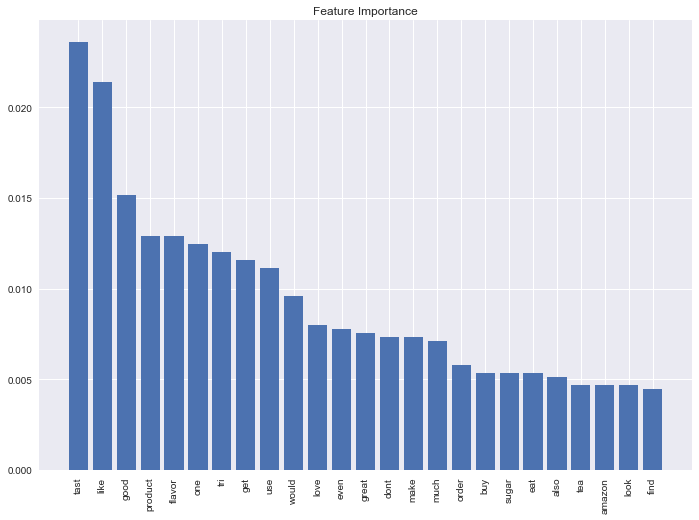

In [114]:
importances = clf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1][:25]

# Rearrange feature names so they match the sorted feature importances
names = count_vect.get_feature_names()

sns.set(rc={'figure.figsize':(11.7,8.27)})

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(25), importances[indices])

# Add feature names as x-axis labels
names = np.array(names)
plt.xticks(range(25), names[indices], rotation=90)

# Show plot
plt.show()

# TFIDF

In [61]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(final_sample,final_score,test_size=0.3,shuffle=False)

In [62]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vect = TfidfVectorizer()
Vocabulary = tfidf_vect.fit_transform(X_train)


In [63]:
tfidf_X_train=tfidf_vect.transform(X_train)
tfidf_X_test=tfidf_vect.transform(X_test)

In [106]:
optimal_hyperparamter(tfidf_X_train,Y_train)

{'n_estimators': 50}

# RANDOM FOREST CLASSIFIER

 accuracy with baselearner = 50  is  87.29
F1 score with baselearner= 50  is  76.48
Recall with baselearner = 50  is  80.54
Precision with baselearner= 50  is  73.9

 Classification report  with baselearner = 50  is 
               precision    recall  f1-score   support

   negative       0.53      0.71      0.61      4103
   positive       0.95      0.90      0.92     25897

avg / total       0.89      0.87      0.88     30000

**************************
train_score is 0.9124857142857142
***************************
test_score is 0.8729333333333333


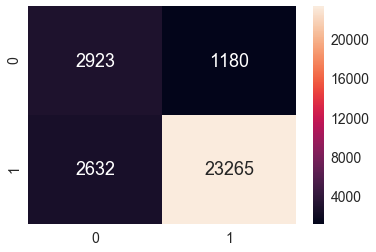

In [64]:
 RANDOMFORESTCLASSIFIER(tfidf_X_train,Y_train,tfidf_X_test,Y_test,50)

In [115]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=50,max_features='auto',max_depth=18)
clf.fit(tfidf_X_train,Y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=18, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [65]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=50,max_features='auto',max_depth=18)
clf.fit(tfidf_X_train,Y_train)
estimator = clf.estimators_[5]

from sklearn.tree import export_graphviz

from sklearn import tree
tree.export_graphviz(estimator,out_file='tree2.dot')  

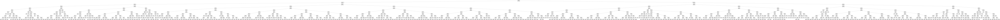

In [66]:
from subprocess import call

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree2.png')

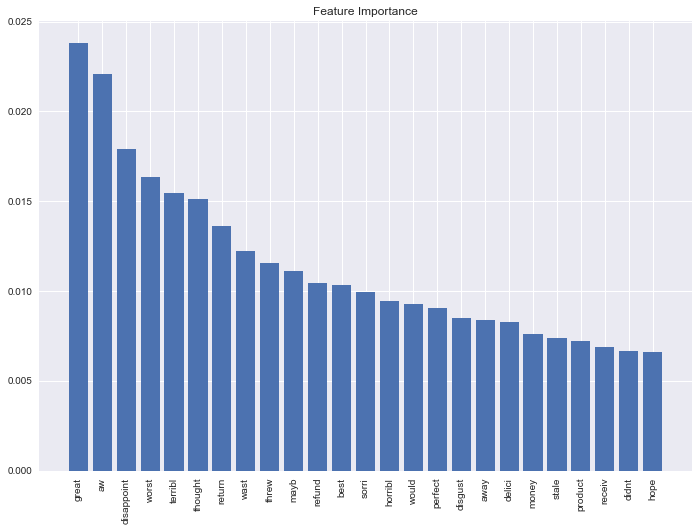

In [116]:
importances = clf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1][:25]

# Rearrange feature names so they match the sorted feature importances
names = tfidf_vect.get_feature_names()

sns.set(rc={'figure.figsize':(11.7,8.27)})

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(25), importances[indices])

# Add feature names as x-axis labels
names = np.array(names)
plt.xticks(range(25), names[indices], rotation=90)

# Show plot
plt.show()

# GBDT ON TFIDF

In [205]:
optimal_hyperparamter_gbdt(tfidf_X_train,Y_train)

{'learning_rate': 0.3, 'max_depth': 4, 'n_estimators': 450}

 accuracy with depth = 4  is  91.75
F1 score with depth= 4  is  79.1
Recall with depth= 4  is  74.61
Precision with depth= 4  is  87.25

 Classification report  with depth= 4  is 
               precision    recall  f1-score   support

   negative       0.82      0.51      0.63      4103
   positive       0.93      0.98      0.95     25897

avg / total       0.91      0.92      0.91     30000

**************************
train_score is 0.9630714285714286
***************************
test_score is 0.9175


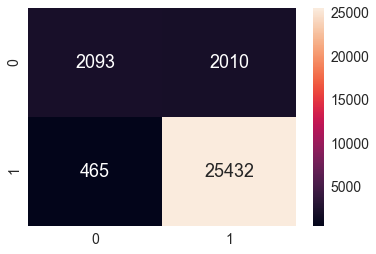

In [206]:
gdbtclassifier(tfidf_X_train,Y_train,tfidf_X_test,Y_test,450,4,0.3)

In [117]:
from xgboost import XGBClassifier

clf = XGBClassifier(n_estimators=450,max_features='auto',max_depth=4,learning_rate=0.3)
clf.fit(tfidf_X_train,Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.3, max_delta_step=0,
       max_depth=4, max_features='auto', min_child_weight=1, missing=None,
       n_estimators=450, n_jobs=1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
       subsample=1)

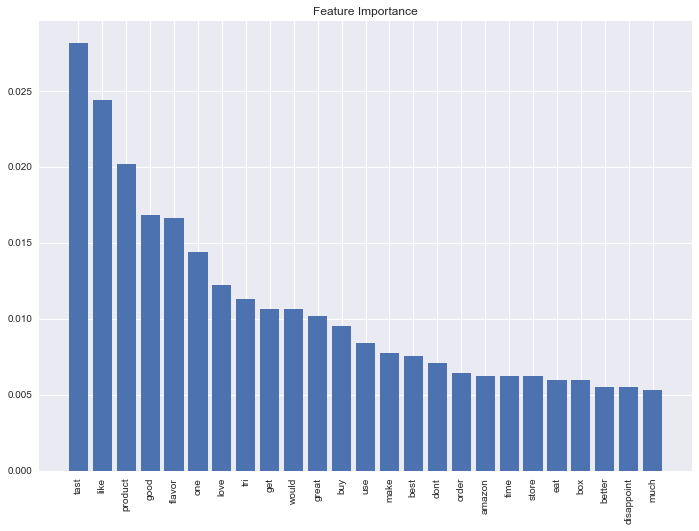

In [118]:
importances = clf.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1][:25]

# Rearrange feature names so they match the sorted feature importances
names = tfidf_vect.get_feature_names()

sns.set(rc={'figure.figsize':(11.7,8.27)})

# Create plot
plt.figure()

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(25), importances[indices])

# Add feature names as x-axis labels
names = np.array(names)
plt.xticks(range(25), names[indices], rotation=90)

# Show plot
plt.show()

# Word 2 vec

In [68]:
from sklearn.model_selection import train_test_split
X_Train_w2v,X_Test_w2v,Y_Train_w2v,Y_Test_w2v = train_test_split(final_sample,final_score,shuffle=False)


In [69]:
i=0
list_of_sent2=[]
for sent in tqdm(X_Train_w2v):
    
    list_of_sent2.append(sent.split())

100%|██████████████████████████████████████████████████████████████████████████| 75000/75000 [00:18<00:00, 3990.22it/s]


In [70]:
w2v_model = gensim.models.Word2Vec(list_of_sent2,min_count=5,size=50, workers=4)

In [ ]:
savetofile(list_of_sent2,"list_of_sent2")

In [140]:
w2v_model.most_similar("like")

[('weird', 0.6974764466285706),
 ('think', 0.6570702791213989),
 ('okay', 0.648568868637085),
 ('good', 0.6277111768722534),
 ('prefer', 0.6270756125450134),
 ('gross', 0.6202515363693237),
 ('remind', 0.6084762811660767),
 ('fake', 0.6059607863426208),
 ('dislik', 0.604829728603363),
 ('aw', 0.6017522811889648)]

In [71]:
w2v_words = list(w2v_model.wv.vocab)


In [72]:
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sent2): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

100%|███████████████████████████████████████████████████████████████████████████| 75000/75000 [01:40<00:00, 743.82it/s]


75000
50


In [73]:
final_w2v_sample = np.array(sent_vectors)
final_score=final['Score'].values[0:len(final_w2v_sample)]
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(final_w2v_sample,final_score,test_size=0.3,shuffle=False)

In [74]:
from sklearn import preprocessing 
avgw2v_X_train= X_train
avgw2v_X_test =X_test

In [120]:
Y_train.shape

(52500,)

# RANDOM FOREST CLASSIFIER

In [115]:
optimal_hyperparamter(avgw2v_X_train,Y_train)

{'n_estimators': 100}

In [212]:
optimal_hyperparamter_gbdt(avgw2v_X_train,Y_train)

{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 400}

# Changing depth 

In [102]:
def RANDOMFORESTCLASSIFIER2(X_train,Y_train,X_test,Y_test,optimum_baselearner):
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import confusion_matrix
    from sklearn.metrics import precision_score
    from sklearn.metrics import f1_score
    from sklearn.metrics import recall_score
    from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
    from sklearn.ensemble import RandomForestClassifier
    clf = RandomForestClassifier(n_estimators=optimum_baselearner,max_features='auto',max_depth=10,class_weight='balanced')
    clf.fit(X_train,Y_train)
    pred = clf.predict(X_test)
    print(' accuracy with baselearner =',optimum_baselearner,' is ' ,np.round((accuracy_score(Y_test, pred)*100),decimals = 2))
    print('F1 score with baselearner=',optimum_baselearner,' is ' , np.round((f1_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print('Recall with baselearner =',optimum_baselearner,' is ' , np.round((recall_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print('Precision with baselearner=',optimum_baselearner,' is ' , np.round((precision_score(Y_test, pred,average= 'macro')*100),decimals = 2))
    print ('\n Classification report  with baselearner =',optimum_baselearner,' is \n ' , classification_report(Y_test,pred)) 
   
    df_cm = pd.DataFrame(confusion_matrix(Y_test, pred), range(2),range(2))
    sns.set(font_scale=1.4)
    sns.heatmap(df_cm, annot=True,annot_kws={"size": 18}, fmt='g')
    print("**************************")
    print("train_score is",clf.score(X_train,Y_train))
    print("***************************")
    print("test_score is",clf.score(X_test,Y_test))

 accuracy with baselearner = 100  is  85.96
F1 score with baselearner= 100  is  73.18
Recall with baselearner = 100  is  77.11
Precision with baselearner= 100  is  70.79

 Classification report  with baselearner = 100  is 
               precision    recall  f1-score   support

   negative       0.47      0.65      0.55      2924
   positive       0.94      0.89      0.92     19576

avg / total       0.88      0.86      0.87     22500

**************************
train_score is 0.9160571428571429
***************************
test_score is 0.8596


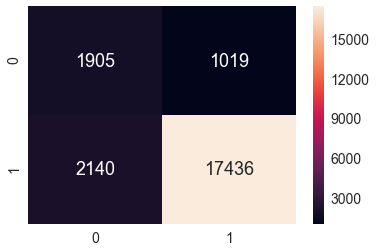

In [90]:
 RANDOMFORESTCLASSIFIER2(avgw2v_X_train,Y_train,avgw2v_X_test,Y_test,100)

In [125]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100,max_features='auto',max_depth=10)

clf.fit(avgw2v_X_train,Y_train)
estimator = clf.estimators_[5]

from sklearn.tree import export_graphviz

from sklearn import tree
tree.export_graphviz(estimator,out_file='tree3.dot')  

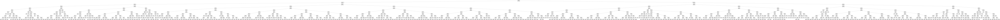

In [126]:
from subprocess import check_call
check_call(['dot','-Tpng','tree2.dot','-o','tree2.png'])
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree3.png')

# GBDT ON AVGWORD 2 VEC

 accuracy with depth = 4  is  90.5
F1 score with depth= 4  is  73.91
Recall with depth= 4  is  69.62
Precision with depth= 4  is  82.91

 Classification report  with depth= 4  is 
               precision    recall  f1-score   support

   negative       0.74      0.41      0.53      2924
   positive       0.92      0.98      0.95     19576

avg / total       0.89      0.90      0.89     22500

**************************
train_score is 0.9416190476190476
***************************
test_score is 0.9049777777777778


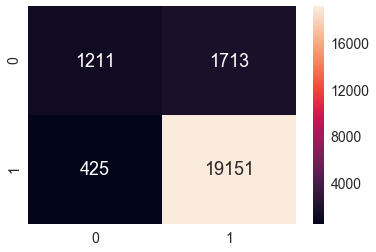

In [213]:
gdbtclassifier(avgw2v_X_train,Y_train,avgw2v_X_test,Y_test,400,4,0.1)

# TFIDF WORD 2 Vec

In [91]:
from sklearn.feature_extraction.text import TfidfVectorizer



In [92]:
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(final['CleanedText'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [93]:
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent2): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*sent.count(word)
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

100%|███████████████████████████████████████████████████████████████████████████| 75000/75000 [01:54<00:00, 654.93it/s]


In [94]:

final_tfidf_sample=np.array(tfidf_sent_vectors)
final_tfidf_score=final['Score'].values[0:len(final_tfidf_sample)]


In [95]:
len(final_tfidf_score)

75000

In [96]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(final_tfidf_sample,final_tfidf_score,test_size=0.3,shuffle=False)

In [97]:
from sklearn import preprocessing
tfidf_w2v_X_train= X_train
tfidf_w2v_X_test= X_test

In [98]:
len(Y_train)

52500

# RANDOM FOREST CLASSIFIER

In [163]:
optimal_hyperparamter(tfidf_w2v_X_train,Y_train)

{'n_estimators': 150}

 accuracy with baselearner = 150  is  85.23
F1 score with baselearner= 150  is  70.77
Recall with baselearner = 150  is  73.36
Precision with baselearner= 150  is  69.01

 Classification report  with baselearner = 150  is 
               precision    recall  f1-score   support

   negative       0.45      0.57      0.50      2924
   positive       0.93      0.89      0.91     19576

avg / total       0.87      0.85      0.86     22500

**************************
train_score is 0.9169904761904762
***************************
test_score is 0.8523111111111111


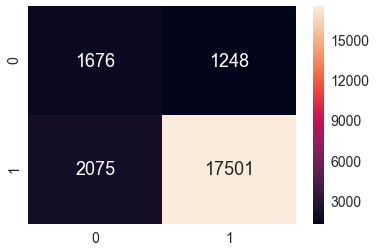

In [103]:
 RANDOMFORESTCLASSIFIER2(tfidf_w2v_X_train,Y_train,tfidf_w2v_X_test,Y_test,150)

In [224]:
tfidf_w2v_X_train.shape

(52500, 50)

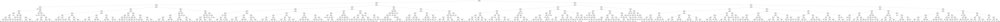

In [127]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=150,max_features='auto',max_depth=10)
clf.fit(tfidf_w2v_X_train,Y_train)
estimator = clf.estimators_[5]

from sklearn.tree import export_graphviz

from sklearn import tree
tree.export_graphviz(estimator,out_file='tree3.dot')  
from subprocess import check_call
check_call(['dot','-Tpng','tree3.dot','-o','tree3.png'])
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree3.png')

# GBDT ON TFIDF W2V

In [225]:
optimal_hyperparamter_gbdt(tfidf_w2v_X_train,Y_train)

{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 450}

 accuracy with depth = 4  is  89.45
F1 score with depth= 4  is  69.27
Recall with depth= 4  is  65.18
Precision with depth= 4  is  80.56

 Classification report  with depth= 4  is 
               precision    recall  f1-score   support

   negative       0.70      0.32      0.44      2924
   positive       0.91      0.98      0.94     19576

avg / total       0.88      0.89      0.88     22500

**************************
train_score is 0.9365523809523809
***************************
test_score is 0.8944888888888889


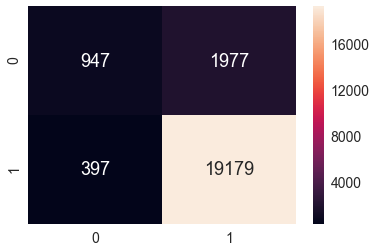

In [226]:
gdbtclassifier(tfidf_w2v_X_train,Y_train,tfidf_w2v_X_test,Y_test,450,4,0.1)

# PERFORMANCE TABLE FOR RANDOM FOREST

| vectorizer | no. of base learners | train score | test score |
| ---- | ---- | --- | --- |
|bow|50|0.90|0.86|
|TFIDF|50|0.91|0.87|
|avgw2v|100|0.91|0.86|
|Tfidf w2v|150|0.91|0.85|


# PERFORMANCE TABLE FOR GBDT CLASSIFIER

| Vectorizer | No. of base learners| DEPTH | LEARNING RATE | train score | test score |
| ---- | ---- | --- | --- |
|bow|450|4|0.5|0.96|0.91|
|TFIDF|450|4|0.3|0.96|0.91|
|avgw2v|400|4|0.1|0.94|0.90|
|Tfidf w2v|450|4|0.1|0.93|0.89|


# summary

performed random forest classifier and gbdt classifier on amazon fine food review

did cross validation for no. of base learners for random forest classifier with max_depth =  18


did cross vaidation for no. of base learners , depth and iteration rate for gradient boosting decision tree

visualize decision tree no.5 for every random forest model using graphviz

realized that as the depth increase ,the chances of overfiiting also increases